In [1]:
from torchvision.models import resnet50, vgg19
from torchvision.io.image import read_image
import torch
from torchcam.methods import SmoothGradCAMpp, LayerCAM
from torchvision import transforms
import matplotlib.pyplot as plt
from typing import List
from torchcam.utils import overlay_mask

In [21]:
# TODO: Maybe split the plots to other functions
def get_multiple_layers_result(model, img, input_tensor, layers: List[str], alpha):
    # Retrieve the CAM from several layers at the same time
    cam_extractor = LayerCAM(model, layers)

    # Preprocess your data and feed it to the model
    output = model(input_tensor.unsqueeze(0))
    # Retrieve the CAM by passing the class index and the model output
    cams = cam_extractor(output.squeeze(0).argmax().item(), output)

    cam_per_layer_list = []
    # Get the cam per target layer provided
    for cam in cams:
        cam_per_layer_list.append(cam.shape)

    print("The cams per target layer are: ", cam_per_layer_list)

    # Raw CAM
    _, axes = plt.subplots(1, len(cam_extractor.target_names))
    for id, name, cam in zip(
        range(len(cam_extractor.target_names)), cam_extractor.target_names, cams
    ):
        axes[id].imshow(cam.squeeze(0).numpy())
        axes[id].axis("off")
        axes[id].set_title(name)
    plt.show()

    fused_cam = cam_extractor.fuse_cams(cams)
    # Plot the raw version
    plt.imshow(fused_cam.squeeze(0).numpy())
    plt.axis("off")
    plt.title(" + ".join(cam_extractor.target_names))
    plt.show()
    # Plot the overlayed version
    result = overlay_mask(
        transforms.functional.to_pil_image(img),
        transforms.functional.to_pil_image(fused_cam, mode="F"),
        alpha=alpha,
    )
    plt.imshow(result)
    plt.axis("off")
    plt.title(" + ".join(cam_extractor.target_names))
    plt.show()

    cam_extractor.remove_hooks()


def get_localisation_mask(model, input_tensor, img):

    # Retrieve CAM for differnet layers at the same time
    cam_extractor = LayerCAM(model)
    output = model(input_tensor.unsqueeze(0))
    cams = cam_extractor(output.squeeze(0).argmax().item(), output)

    # Transformations
    resized_cams = [
        transforms.functional.resize(
            transforms.functional.to_pil_image(cam.squeeze(0)), img.shape[-2:]
        )
        for cam in cams
    ]
    segmaps = [
        transforms.functional.to_pil_image(
            (transforms.functional.resize(cam, img.shape[-2:]).squeeze(0) >= 0.5).to(
                dtype=torch.float32
            )
        )
        for cam in cams
    ]

    # Plots
    for name, cam, seg in zip(cam_extractor.target_names, resized_cams, segmaps):
        _, axes = plt.subplots(1, 2)
        axes[0].imshow(cam)
        axes[0].axis("off")
        axes[0].set_title(name)
        axes[1].imshow(seg)
        axes[1].axis("off")
        axes[1].set_title(name)
        plt.show()

    cam_extractor.remove_hooks()


def extract_cam(
    img,
    input_tensor,
    model,
    target_layer=None,
    localisation_mask: bool = True,
    multiple_layers: List[str] = [],
    alpha=0.5,
):
    cam_extractor = SmoothGradCAMpp(model, target_layer=target_layer)
    output = model(input_tensor.unsqueeze(0))
    # Get the CAM giving the class index and output
    cams = cam_extractor(output.squeeze(0).argmax().item(), output)

    cam_per_layer_list = []
    # Get the cam per target layer provided
    for cam in cams:
        cam_per_layer_list.append(cam.shape)

    print("The cams per target layer are: ", cam_per_layer_list)

    # The raw CAM
    for name, cam in zip(cam_extractor.target_names, cams):
        plt.imshow(cam.squeeze(0).numpy())
        plt.axis("off")
        plt.title(name)
        plt.show()

    # Overlayed on the image
    for name, cam in zip(cam_extractor.target_names, cams):
        result = overlay_mask(
            transforms.functional.to_pil_image(img),
            transforms.functional.to_pil_image(cam.squeeze(0), mode="F"),
            alpha=alpha,
        )
        plt.imshow(result)
        plt.axis("off")
        plt.title(name)
        plt.show()

    cam_extractor.remove_hooks()

    if localisation_mask:
        get_localisation_mask(model, input_tensor, img)

    if len(multiple_layers) > 0:
        get_multiple_layers_result(model, img, input_tensor, multiple_layers, alpha)

In [22]:
resnet50_model = resnet50(weights="ResNet50_Weights.DEFAULT").eval()
vgg19_model = vgg19(weights="VGG19_Weights.DEFAULT").eval()

In [23]:
img = read_image("nam-anh-QJbyG6O0ick-unsplash.jpg")


In [24]:
trans_params = {"ImageNet_transformation":
  {"Resize": {"h": 224,"w": 224},
  "Normalize": {"mean": [0.485, 0.456, 0.406], "std": [0.229, 0.224, 0.225]}}}

In [25]:
def transform_image(
    img,
    trans_params,
):
    """Loads an image from a any path and transforms it based on specific params.

    Args:
        trans_params (dict): the specific transformation params

    Returns:
        input_tensor: The tensor to be input in the model algorithm
    """

    resize = trans_params["Resize"]

    normalize = trans_params["Normalize"]
    input_tensor = transforms.functional.normalize(
        transforms.functional.resize(img, (resize["h"], resize["w"])) / 255.0,
        normalize["mean"],
        normalize["std"],
    )

    return input_tensor

In [26]:
input_tensor = transform_image(img, trans_params["ImageNet_transformation"])


/Users/stavrostheocharis/Desktop/Projects/easy_explain/.venv/lib/python3.11/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


The cams per target layer are:  [torch.Size([1, 7, 7])]


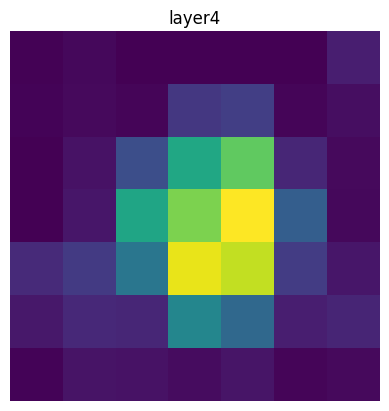

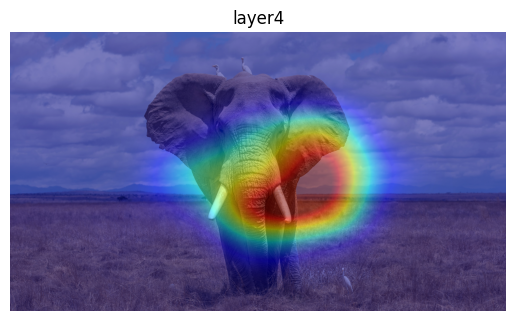

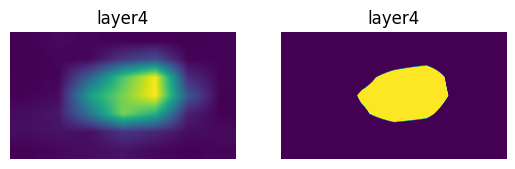

The cams per target layer are:  [torch.Size([1, 28, 28]), torch.Size([1, 14, 14]), torch.Size([1, 7, 7])]


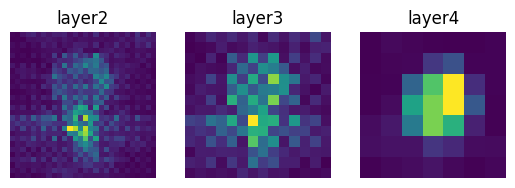

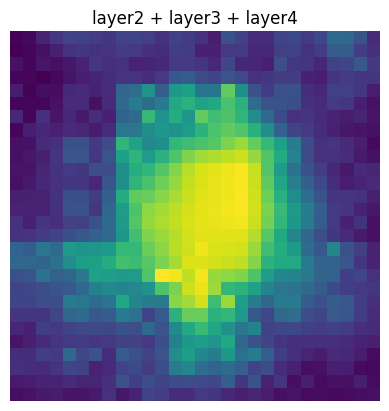

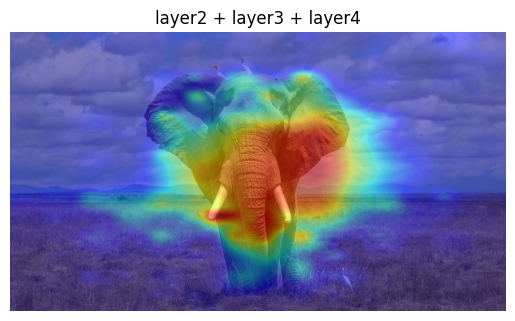

In [27]:
extract_cam(img, input_tensor, resnet50_model, multiple_layers=["layer2", "layer3", "layer4"])


The cams per target layer are:  [torch.Size([1, 224, 224]), torch.Size([1, 224, 224]), torch.Size([1, 224, 224]), torch.Size([1, 224, 224]), torch.Size([1, 112, 112]), torch.Size([1, 112, 112]), torch.Size([1, 112, 112]), torch.Size([1, 112, 112]), torch.Size([1, 112, 112]), torch.Size([1, 56, 56]), torch.Size([1, 56, 56]), torch.Size([1, 56, 56]), torch.Size([1, 56, 56]), torch.Size([1, 56, 56]), torch.Size([1, 56, 56]), torch.Size([1, 56, 56]), torch.Size([1, 56, 56]), torch.Size([1, 56, 56]), torch.Size([1, 28, 28]), torch.Size([1, 28, 28]), torch.Size([1, 28, 28]), torch.Size([1, 28, 28]), torch.Size([1, 28, 28]), torch.Size([1, 28, 28]), torch.Size([1, 28, 28]), torch.Size([1, 28, 28]), torch.Size([1, 28, 28]), torch.Size([1, 14, 14]), torch.Size([1, 14, 14]), torch.Size([1, 14, 14]), torch.Size([1, 14, 14]), torch.Size([1, 14, 14]), torch.Size([1, 14, 14]), torch.Size([1, 14, 14]), torch.Size([1, 14, 14])]


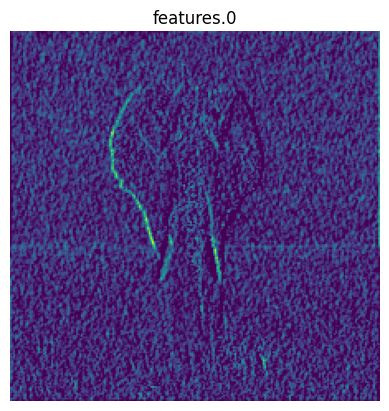

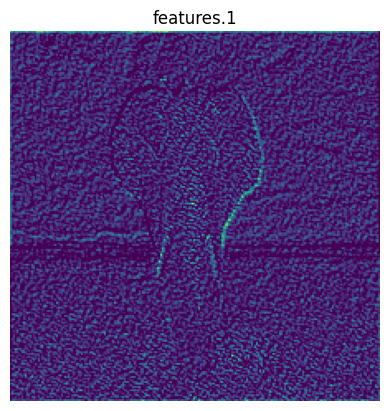

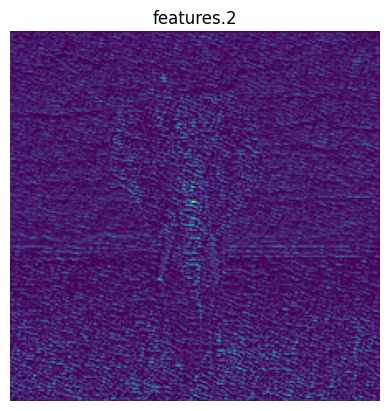

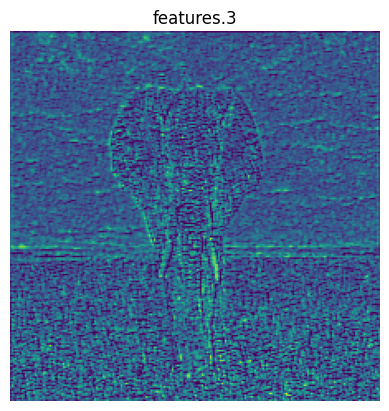

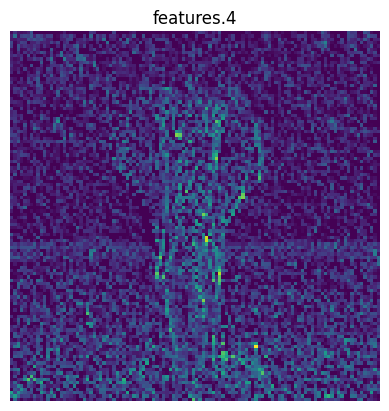

...

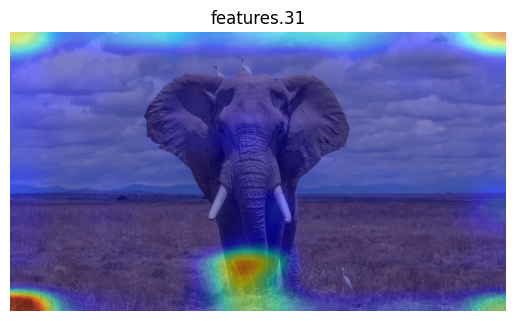

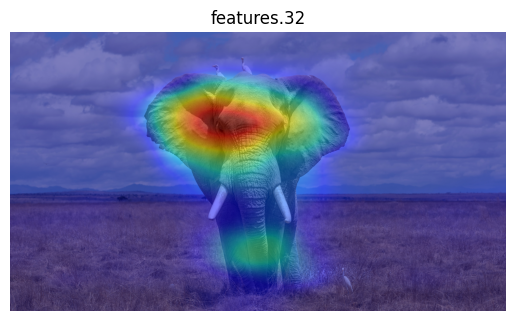

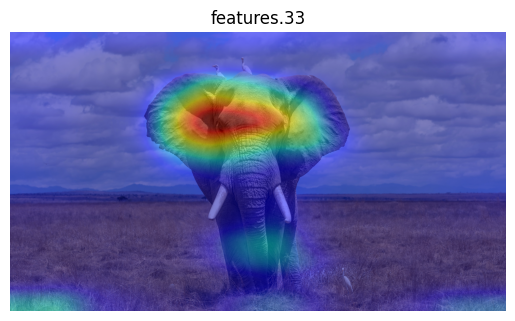

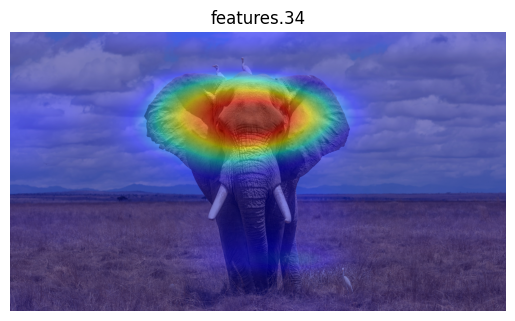

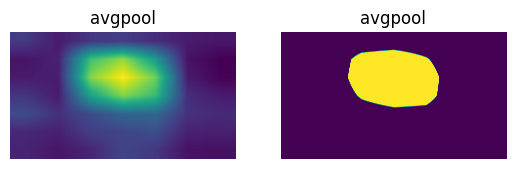

In [12]:
# Keep the features layers until the last CNN layer
features = []
features = [vgg19_model.features[x] for x in range(35)]

# Give as input all the gathered features layers
extract_cam(img, input_tensor, vgg19_model, target_layer=features)